<h2> Models to Predict the Numbers of Deaths Due to Covid-19 Pandamic in a Country </h2>

<h2> 
By Michael Kumakech
</h2>

<h2> PART 1: Model Development </h2>



In this section, we will develop several models that will predict the number deaths due to Convid-19 Pandemic in the World using the variables or features. This is just an estimate but should give us an objective idea of how much the Pandemic will cost.

Data Analytics, we often use Model Development to help us predict future observations from the data we have. In Artificial Intelligence, a Model will help us understand the exact relationship between different variables and how these variables are used to predict the result.


<b> Import Libaries</b>

In [1]:
import requests
import lxml.html as lh
import pandas as pd

<b> Remove the website to be put in the notebook</b>

In [2]:
WHO_url = 'https://github.com/mkumakech/Covid-19_Pandemic/blob/master/WHO_Covid_19_Jan22_2021.csv' #assign the wiki page
#WHO_url = 'https://data.humdata.org/dataset/novel-coronavirus-2019-ncov-cases'

page = requests.get(WHO_url) # create a handle to for contents of the wiki page

doc = lh.fromstring(page.content) # store content of the wiki page under doc

tr_elements = doc.xpath('//tr') # parse data stored between tr in the html

[len(T) for T in tr_elements[:12]] # check the length of the first 12 rows

[12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12]

<b> Check the table headers</b>

In [3]:

tr_elements = doc.xpath('//tr') # parse first row as header

col = [] # create empty list
i = 0

for t in tr_elements[0]: # for each row, store each first element (header) and an empty list
    i+=1
    name=t.text_content()
    print("%d:%s" % (i,name))
    col.append((name,[]))


1:
2:Name
3:WHO Region
4:Cases _cumulative total
5:Cases _cumulative total per 1 million population
6:Cases _newly reported in last 7 days
7:Cases _newly reported in last 24 hours
8:Deaths _cumulative total
9:Deaths_ cumulative total per 1 million population
10:Deaths _newly reported in last 7 days
11:Deaths _newly reported in last 24 hours
12:Transmission Classification


<b> Check the data in other Row</b>

In [4]:
for j in range(1,len(tr_elements)): # Because header is the first row, data would be store in the subsequent rows.
    T = tr_elements[j] #T is j'th row
    
    if len(T)!=12: #if row is not size 3, //tr data is not from the table.
        break
        
    i = 0 #i is the index of the first column
    
    for t in T.iterchildren(): #iterate through each element of the row
        data=t.text_content()
            
        col[i][1].append(data) #append the data to the empty list of the i'th column
            
        i+=1 #increment i for the next column

<b> What about the numbers of rows and columns</b>

In [5]:
[len(C) for (title,C) in col]

[238, 238, 238, 238, 238, 238, 238, 238, 238, 238, 238, 238]

<b> Displays the data frame with three columns.</b>

In [6]:
Dict = {title:column for (title,column) in col}
df = pd.DataFrame(Dict)

In [7]:
df.head()

,,Name,WHO Region,Cases _cumulative total,Cases _cumulative total per 1 million population,Cases _newly reported in last 7 days,Cases _newly reported in last 24 hours,Deaths _cumulative total,Deaths_ cumulative total per 1 million population,Deaths _newly reported in last 7 days,Deaths _newly reported in last 24 hours,Transmission Classification
0,,South Africa,Africa,1369426,23089.8,91123,12710,38854,655.11,3714,566,Community transmission
1,,Ethiopia,Africa,132034,1148.49,2589,307,2044,17.78,38,7,Community transmission
2,,Nigeria,Africa,114691,556.38,10692,1386,1478,7.17,96,14,Community transmission
3,,Algeria,Africa,104606,2385.48,1965,265,2854,65.08,38,6,Community transmission
4,,Kenya,Africa,99444,1849.39,889,136,1736,32.28,16,2,Community transmission


In [8]:
df.tail()

,,Name,WHO Region,Cases _cumulative total,Cases _cumulative total per 1 million population,Cases _newly reported in last 7 days,Cases _newly reported in last 24 hours,Deaths _cumulative total,Deaths_ cumulative total per 1 million population,Deaths _newly reported in last 7 days,Deaths _newly reported in last 24 hours,Transmission Classification
233,,Pitcairn Islands,Western Pacific,0,0,0,0,0,0,0,0,No cases
234,,Tokelau,Western Pacific,0,0,0,0,0,0,0,0,No cases
235,,Tonga,Western Pacific,0,0,0,0,0,0,0,0,No cases
236,,Tuvalu,Western Pacific,0,0,0,0,0,0,0,0,No cases
237,,Global,,96012792,12299.38138,4438467,653081,2075870,265.9220328,94619,16943,


<b> Checking the shapes</b>

In [9]:
df.shape

(238, 12)

<h2> Clean the dataframe</h2>

In [10]:
import pandas as pd
import numpy as np

<b>Remove Row 204 that have total record</b>

In [11]:
# Delete row at index Name: Global
df2 = df.drop([df.index[237]])
df2

,,Name,WHO Region,Cases _cumulative total,Cases _cumulative total per 1 million population,Cases _newly reported in last 7 days,Cases _newly reported in last 24 hours,Deaths _cumulative total,Deaths_ cumulative total per 1 million population,Deaths _newly reported in last 7 days,Deaths _newly reported in last 24 hours,Transmission Classification
0,,South Africa,Africa,1369426,23089.8,91123,12710,38854,655.11,3714,566,Community transmission
1,,Ethiopia,Africa,132034,1148.49,2589,307,2044,17.78,38,7,Community transmission
2,,Nigeria,Africa,114691,556.38,10692,1386,1478,7.17,96,14,Community transmission
3,,Algeria,Africa,104606,2385.48,1965,265,2854,65.08,38,6,Community transmission
4,,Kenya,Africa,99444,1849.39,889,136,1736,32.28,16,2,Community transmission
...,...,...,...,...,...,...,...,...,...,...,...,...
232,,Palau,Western Pacific,0,0,0,0,0,0,0,0,No cases
233,,Pitcairn Islands,Western Pacific,0,0,0,0,0,0,0,0,No cases
234,,Tokelau,Western Pacific,0,0,0,0,0,0,0,0,No cases
235,,Tonga,Western Pacific,0,0,0,0,0,0,0,0,No cases


<h2> Data Analysis</h2>

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,PolynomialFeatures
%matplotlib inline

In [13]:
%%capture
! pip install seaborn

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

<h2> Explore the Data</h2>

In [15]:
df2.describe()

,,Name,WHO Region,Cases _cumulative total,Cases _cumulative total per 1 million population,Cases _newly reported in last 7 days,Cases _newly reported in last 24 hours,Deaths _cumulative total,Deaths_ cumulative total per 1 million population,Deaths _newly reported in last 7 days,Deaths _newly reported in last 24 hours,Transmission Classification
count,237,237,237,237,237,237,237,237,237,237,237,237
unique,1,237,7,221,225,195,144,181,205,108,68,6
top,,Cayman Islands,Europe,0,0,0,0,0,0,0,0,Community transmission
freq,237,1,62,13,13,29,70,33,33,79,121,134


<b> We can see we have missing values for the columns.</b>

In [16]:
print("number of NaN values for the column Name :", df2['Name'].isnull().sum())
print("number of NaN values for the column WHO Region:", df2['WHO Region'].isnull().sum())
print("number of NaN values for the column Cases _newly reported in last 7 days:", df2['Cases _newly reported in last 7 days'].isnull().sum())
print("number of NaN values for the column Cases _newly reported in last 24 hours :", df2['Cases _newly reported in last 24 hours'].isnull().sum())
print("number of NaN values for the column Deaths _cumulative total :", df2['Deaths _cumulative total'].isnull().sum())
print("number of NaN values for the column Transmission Classification :", df2['Transmission Classification'].isnull().sum())

number of NaN values for the column Name : 0
number of NaN values for the column WHO Region: 0
number of NaN values for the column Cases _newly reported in last 7 days: 0
number of NaN values for the column Cases _newly reported in last 24 hours : 0
number of NaN values for the column Deaths _cumulative total : 0
number of NaN values for the column Transmission Classification : 0


<b> Exploratory data analysis</b>

In [17]:
df2['WHO Region'].value_counts().to_frame()

,WHO Region
Europe,62
Americas,56
Africa,50
Western Pacific,35
Eastern Mediterranean,22
South-East Asia,11
Other,1


In [18]:
df2['Transmission Classification'].value_counts().to_frame()

,Transmission Classification
Community transmission,134
Clusters of cases,49
Sporadic cases,28
No cases,22
Pending,3
Not applicable,1


<h2> Model Development</h2>

In [19]:

#Import libraries 
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression 
%matplotlib inline

<b>Import packages</b>

In [20]:
!conda install -c anaconda xlrd --yes

Solving environment: failed with initial frozen solve. Retrying with flexible solve.
Solving environment: failed with repodata from current_repodata.json, will retry with next repodata source.
Solving environment: failed with initial frozen solve. Retrying with flexible solve.
Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python-3.7-main

  added / updated specs:
    - xlrd


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    _libgcc_mutex-0.1          |             main           3 KB  anaconda
    _py-xgboost-mutex-2.0      |            cpu_0           9 KB  anaconda
    _pytorch_select-0.1        |            cpu_0           2 KB  anaconda
    absl-py-0.10.0             |           py37_0         169 KB  anaconda
    aiohttp-3.6.3              |   py37h7b6447c_0         626 KB  anaconda
    argon2-cffi-20.1.0         |   py37h7b6447c_1          49

<h2> Model 1a: Simple Linear Regression Development</h2>

(a)We can Fit a linear regression model using the <b> Cases _cumulative tota</b> feature and caculate the R^2 for <b> Deaths _cumulative total</b>

In [21]:
X = df2[['Cases _cumulative total']] 
Y = df2['Deaths _cumulative total'] 
lm = LinearRegression() 
lm 
lm.fit(X,Y)
lm.score(X, Y)

0.9139638502330641

<b> How could identified cases help us predict deaths? </b>

In [22]:
X = df2[['Cases _cumulative total']] 
Y = df2['Deaths _cumulative total']
lm = LinearRegression()
lm
lm.fit(X,Y)

Yhat=lm.predict(X)
Yhat[0:5]

array([25900.18409297,  3904.70568523,  3596.42214854,  3417.15446317,
        3325.39642728])

<b> What is the value of the intercept ? </b>

In [23]:
lm.intercept_

1557.7121729968876

<b> What is the value of the Slope ? </b>

In [24]:
lm.coef_

array([0.01777568])

In [57]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

<h2> What is the final estimated linear model we get?</h2>

As we saw above, we should get a final linear model with the structure: Yhat = a + b X

Plugging in the actual values we get:

<b>Deaths _cumulative total = 1557.712 + 0.0178 x Cases _cumulative total</b> as of data  the WHO update of 22 January 2021 at 10:46:09 am. However, this Linear model keeps changing as the numbers of cases and deaths increases.

<h2> Model 1b: Simple Linear Regression</h2>


(b)We can Fit a linear regression model using the Confirmed cases in the last 7 days feature and caculate the R^2 for Deaths

In [25]:
X = df2[['Cases _newly reported in last 7 days']] 
Y = df2['Deaths _cumulative total'] 
lm = LinearRegression() 
lm 
lm.fit(X,Y)
lm.score(X, Y)

0.8459216996294472

(c)We can Fit a linear regression model using the Cases _newly reported in last 24 hours feature and caculate the R^2 for Deaths

In [26]:
X = df2[['Cases _newly reported in last 24 hours']] 
Y = df2['Deaths _cumulative total'] 
lm = LinearRegression() 
lm 
lm.fit(X,Y)
lm.score(X, Y)

0.8704345253071311



When you compare Model 1(a): Simple Linear Regression and Model 1(b) and 1(c): Simple Linear Regression the R^2 values are ~91.4%, ~84.6%, ~ 87%</B>. Thus, Model 1 (a) performs better than that in (b) and (c). We use Cases _cumulative total when developing Linear Regression model.


<h2> Measures for In-Sample Evaluation of Linear Regression</h2>

<h2> R-squared</h2>
R squared, also known as the coefficient of determination, is a measure to indicate how close the data is to the fitted regression line. The value of the R-squared is the percentage of variation of the response variable (y) that is explained by a linear model. 

<h2>Mean Squared Error (MSE)</h2>
The Mean Squared Error measures the average of the squares of errors, that is, the difference between actual value (y) and the estimated value (ŷ). 

<h2>Let's calculate the MSE</h2>
We can predict the output i.e., "yhat" using the predict method, where X is the input variable: 

In [27]:
Yhat=lm.predict(X)
print('The output of the first four predicted value is: ', Yhat[0:4])

The output of the first four predicted value is:  [32401.80867284  2943.18649221  5505.94173956  2843.43142234]


Lets import the function <b>mean_squared_error </b>from the module metrics.

In [28]:
from sklearn.metrics import mean_squared_error

<h2>We compare the predicted results with the actual results</h2>

In [29]:

mse = mean_squared_error(df2['Deaths _cumulative total'], Yhat)
print('The mean square error of price and predicted value is: ', mse)


The mean square error of price and predicted value is:  154238203.79222253


<h2>Multiple Linear Regression</h2>

<b>What if we want to predict car price using more than one variable?</b>



If we want to use more variables in our model to predict Deaths, we can use <b>Multiple Linear Regression</b>. Multiple Linear Regression is very similar to Simple Linear Regression, but this method is used to explain the relationship between one continuous response (dependent) variable and two or more predictor (independent) variables. Most of the real-world regression models involve multiple predictors. We will illustrate the structure by using four predictor variables, but these results can generalize to any integer:


<B> Let's develop a model using these variables as the predictor variables. </b>

In [30]:
Z = df2[['Cases _cumulative total', 'Cases _newly reported in last 7 days', 'Cases _newly reported in last 24 hours']]


<b>Fit the linear model using the four above-mentioned variables.</b>

In [31]:
lm.fit(Z, df2['Deaths _cumulative total'])

LinearRegression()

<b> What is the value of the intercept(a)?</b>

In [32]:
lm.intercept_

1227.8532966090743

<b>What are the values of the coefficients (b1, b2, b3, b4)?</b>

In [33]:
lm.coef_

array([ 0.01311328, -0.51756709,  4.32263516])

<b> What is the final estimated linear model that we get?</b>

As we saw above, we should get a final linear function with the structure

 <h2> Deaths _cumulative total = 1227.85 + 0.0131*Cases _cumulative total - 0.518* Cases _newly reported in last 7 days + 4.323 * Cases _newly reported in last 24 hours</h2>
As at 10:46:09 am on 22 January 2021. However, the challenge is that this model keeps on changing as data is being updated daily but not significantly. 

<b> Plot graph of Multiple linear regression<b>

<h2> 
Measures for In-Sample Evaluation of Multiple Linear Regression
</h2>

<h2> Model 2: Multiple Linear Regression</h2>

<b> Let's calculate the R^2</b>

In [34]:
# fit the model 
lm.fit(Z, df2['Deaths _cumulative total'])
# Find the R^2
print('The R-square is: ', lm.score(Z, df2['Deaths _cumulative total']))

The R-square is:  0.937133371679735


We can say that ~ <b> 93.7 % </b> of the variation of Deaths _cumulative total is explained by this multiple linear regression "multi_fit"

<b> Let's calculate the MSE.</b>

We produce a prediction

In [35]:
Y_predict_multifit = lm.predict(Z)



we compare the predicted results with the actual results


In [36]:

print('The mean square error of price and predicted value using multifit is: ', \
      mean_squared_error(df2['Deaths _cumulative total'], Y_predict_multifit))


The mean square error of price and predicted value using multifit is:  74838114.5021547


<h2>Decision Making: Determining a Good Model Fit</h2>

Now that we have visualized the different models, and generated the R-squared and MSE values for the fits, how do we determine a good model fit?

<h2>What is a good R-squared value?</h2>

When comparing models, the model with the higher R-squared value is a better fit for the data.

<h2> What is a good MSE? </h2>

When comparing models, the model with the smallest MSE value is a better fit for the data.

<h2> Conclusion:</h2>



Comparing these models, we conclude that the <b>Multiple Linear Regression model</b> is the best model to be able to predict Deaths _cumulative total from our dataset. This result makes sense, since we have 3 variables in total, and we know that more than one of those variables are potential predictors of the final numbers of Deaths _cumulative total.

Model for predicting Deaths _cumulative total based on Cases _cumulative total, Cases _newly reported in last 7 days and Cases _newly reported in last 24 hours for PART 1 of our project is 

<h2> Deaths _cumulative total = 1227.85 + 0.0131*Cases _cumulative total - 0.518* Cases _newly reported in last 7 days + 4.323 * Cases _newly reported in last 24 hours</h2>
As at 10:46:09 am on 22 January 2021. However, the challenge is that this model keeps on changing as data is being updated daily but not significantly. 

In [37]:
def PlotPolly(model, independent_variable, dependent_variabble, Name):
    x_new = np.linspace(15, 55, 100)
    y_new = model(x_new)

    plt.plot(independent_variable, dependent_variabble, '.', x_new, y_new, '-')
    plt.title('Polynomial Fit with Matplotlib for Deaths _cumulative total ~ Length')
    ax = plt.gca()
    ax.set_facecolor((0.898, 0.898, 0.898))
    fig = plt.gcf()
    plt.xlabel(Name)
    plt.ylabel('Deaths _cumulative total')

    plt.show()
    plt.close()

<b> Lets get the variables</b>

In [38]:
x = df['Cases _cumulative total']
y = df['Deaths _cumulative total']

<b>Let's fit the polynomial using the function polyfit, then use the function poly1d to display the polynomial function.</b>

In [39]:
df2.dtypes


                                                     object
Name                                                 object
WHO Region                                           object
Cases _cumulative total                              object
Cases _cumulative total per 1 million population     object
Cases _newly reported in last 7 days                 object
Cases _newly reported in last 24 hours               object
Deaths _cumulative total                             object
Deaths_ cumulative total per 1 million population    object
Deaths _newly reported in last 7 days                object
Deaths _newly reported in last 24 hours              object
Transmission Classification                          object
dtype: object

In [40]:
df2["Cases _cumulative total"] = df2["Cases _cumulative total"].astype(str).astype(int)
df2["Cases _newly reported in last 7 days"] = df2["Cases _newly reported in last 7 days"].astype(str).astype(int)
df2["Cases _newly reported in last 24 hours"] = df2["Cases _newly reported in last 24 hours"].astype(str).astype(int)
df2["Deaths _cumulative total"] = df2["Deaths _cumulative total"].astype(str).astype(int)
print(df2.dtypes)

                                                     object
Name                                                 object
WHO Region                                           object
Cases _cumulative total                               int64
Cases _cumulative total per 1 million population     object
Cases _newly reported in last 7 days                  int64
Cases _newly reported in last 24 hours                int64
Deaths _cumulative total                              int64
Deaths_ cumulative total per 1 million population    object
Deaths _newly reported in last 7 days                object
Deaths _newly reported in last 24 hours              object
Transmission Classification                          object
dtype: object


<h2> PART 2: Machine Learning</h2>

Lets first load required libraries:

In [41]:
import itertools
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import NullFormatter
import pandas as pd
import numpy as np
import matplotlib.ticker as ticker
from sklearn import preprocessing
%matplotlib inline


<h2> Data visualization and pre-processing</h2> 

Let’s see how many of each class is in our data set

In [42]:
df2['Transmission Classification'].value_counts()

Community transmission    134
Clusters of cases          49
Sporadic cases             28
No cases                   22
Pending                     3
Not applicable              1
Name: Transmission Classification, dtype: int64

In [43]:
# notice: installing seaborn might takes a few minutes
!conda install -c anaconda pydotplus -y
!conda install -c anaconda python-graphviz -y
!conda install -c anaconda seaborn -y


Solving environment: failed with initial frozen solve. Retrying with flexible solve.
Solving environment: failed with repodata from current_repodata.json, will retry with next repodata source.
Solving environment: failed with initial frozen solve. Retrying with flexible solve.
Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python-3.7-main

  added / updated specs:
    - pydotplus


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    argon2-cffi-20.1.0         |   py37h7b6447c_1          49 KB  anaconda
    cairo-1.14.12              |       h8948797_3         1.3 MB  anaconda
    defusedxml-0.6.0           |             py_0          23 KB  anaconda
    entrypoints-0.3            |           py37_0          12 KB  anaconda
    fontconfig-2.13.0          |       h9420a91_0         291 KB  anaconda
    fribidi-1.0.10             |       h7b6447c_0       

<h2> 
Feature before One Hot Encoding
</h2>

In [44]:
df2.shape

(237, 12)

In [45]:
df2.head()

,,Name,WHO Region,Cases _cumulative total,Cases _cumulative total per 1 million population,Cases _newly reported in last 7 days,Cases _newly reported in last 24 hours,Deaths _cumulative total,Deaths_ cumulative total per 1 million population,Deaths _newly reported in last 7 days,Deaths _newly reported in last 24 hours,Transmission Classification
0,,South Africa,Africa,1369426,23089.8,91123,12710,38854,655.11,3714,566,Community transmission
1,,Ethiopia,Africa,132034,1148.49,2589,307,2044,17.78,38,7,Community transmission
2,,Nigeria,Africa,114691,556.38,10692,1386,1478,7.17,96,14,Community transmission
3,,Algeria,Africa,104606,2385.48,1965,265,2854,65.08,38,6,Community transmission
4,,Kenya,Africa,99444,1849.39,889,136,1736,32.28,16,2,Community transmission


In [46]:
df2[['Deaths _cumulative total','Cases _cumulative total','Cases _newly reported in last 7 days','Cases _newly reported in last 24 hours', 'Transmission Classification']].head()

,Deaths _cumulative total,Cases _cumulative total,Cases _newly reported in last 7 days,Cases _newly reported in last 24 hours,Transmission Classification
0,38854,1369426,91123,12710,Community transmission
1,2044,132034,2589,307,Community transmission
2,1478,114691,10692,1386,Community transmission
3,2854,104606,1965,265,Community transmission
4,1736,99444,889,136,Community transmission


<b> Use one hot encoding technique to convert categorical varables to binary variables and append them to the feature Data Frame</b>

In [47]:
Feature = df2[['Cases _cumulative total','Deaths _cumulative total']]
Feature = pd.concat([Feature,pd.get_dummies(df2['Transmission Classification'])], axis=1)
Feature.drop(['No cases'], axis = 1,inplace=True)
Feature.drop(['Pending'], axis = 1,inplace=True)
Feature.drop(['Not applicable'], axis = 1,inplace=True)
Feature.head()


,Cases _cumulative total,Deaths _cumulative total,Clusters of cases,Community transmission,Sporadic cases
0,1369426,38854,0,1,0
1,132034,2044,0,1,0
2,114691,1478,0,1,0
3,104606,2854,0,1,0
4,99444,1736,0,1,0


<h2> Feature selection</h2>

Lets defind feature sets, X:

In [48]:
X = Feature
X[0:5]

,Cases _cumulative total,Deaths _cumulative total,Clusters of cases,Community transmission,Sporadic cases
0,1369426,38854,0,1,0
1,132034,2044,0,1,0
2,114691,1478,0,1,0
3,104606,2854,0,1,0
4,99444,1736,0,1,0


<b> What are our lables?</b>

In [49]:
y = df2['Transmission Classification'].values
y[0:5]

array(['Community transmission', 'Community transmission',
       'Community transmission', 'Community transmission',
       'Community transmission'], dtype=object)

In [50]:
y_collection = df2['Transmission Classification'].replace(to_replace=['Community transmission', 'Clusters of cases','Sporadic cases'], value=[2,1,0]).values
y_collection[0:5]

array([2, 2, 2, 2, 2], dtype=object)

<h2> Normalize Data</h2>

Data Standardization give data zero mean and unit variance (technically should be done after train test split 

In [51]:
X_initial = X
scaler = preprocessing.StandardScaler().fit(X_initial)
X= scaler.transform(X)
X[0:10]

array([[ 0.51966847,  0.87225568, -0.51052747,  0.8767307 , -0.36602089],
       [-0.14716528, -0.19462164, -0.51052747,  0.8767307 , -0.36602089],
       [-0.15651146, -0.21102622, -0.51052747,  0.8767307 , -0.36602089],
       [-0.1619463 , -0.17114513, -0.51052747,  0.8767307 , -0.36602089],
       [-0.16472811, -0.20354852, -0.51052747,  0.8767307 , -0.36602089],
       [-0.18661941, -0.24348758, -0.51052747,  0.8767307 , -0.36602089],
       [-0.19625122, -0.23690836, -0.51052747,  0.8767307 , -0.36602089],
       [-0.19750201, -0.2450237 , -0.51052747,  0.8767307 , -0.36602089],
       [-0.20147642, -0.24513963, -0.51052747,  0.8767307 , -0.36602089],
       [-0.20247069, -0.22838725, -0.51052747,  0.8767307 , -0.36602089]])

<h2>Classification</h2>

<h2> Classification with 75% Training dataset and 25% Testing dataset </h2>
The following algorithms were used K Nearest Neighbor(KNN), Decision Tree, Support Vector Machine and Logistic Regression.

<h2>K Nearest Neighbor(KNN)</h2>

Split the initial train set in train and cross validation set. Use 75% of the data set for training and 25% for cross validation

In [52]:
from sklearn.model_selection import train_test_split
X_train, X_cv, y_train, y_cv = train_test_split( X, y, test_size=0.25, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Cross validation set:', X_cv.shape,  y_cv.shape)

Train set: (177, 5) (177,)
Cross validation set: (60, 5) (60,)


<b>Import library</b>

In [53]:
from sklearn import metrics
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, classification_report

In [54]:
from sklearn.metrics import jaccard_score
from sklearn.metrics import f1_score
from sklearn.metrics import log_loss

<b> Find the best k by training and predicting</b>

Train the model for various k between 1 and 9 and choose the one with the best accuracy on the cross validation set.

In [55]:
Ks = 10
mean_acc = np.zeros((Ks-1))
std_acc = np.zeros((Ks-1))
ConfustionMx = [];
for n in range(1,Ks):
    
    #Train Model   
    neigh = KNeighborsClassifier(n_neighbors = n).fit(X_train,y_train)
#Predict on the Cross Validation set
    yhat_cv=neigh.predict(X_cv)
    #Calculate 
    mean_acc[n-1] = metrics.accuracy_score(y_cv, yhat_cv)

    
    std_acc[n-1]=np.std(yhat_cv==y_cv)/np.sqrt(yhat_cv.shape[0])

mean_acc

array([0.95      , 0.96666667, 0.96666667, 0.96666667, 0.96666667,
       0.96666667, 0.96666667, 0.96666667, 0.96666667])

<b> Display the accuracy of the model for the various K </b>

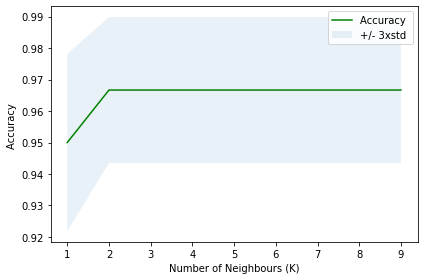

The best accuracy was 0.9666666666666667 with k= 2


In [56]:
plt.plot(range(1,Ks),mean_acc,'g')
plt.fill_between(range(1,Ks),mean_acc - 1 * std_acc,mean_acc + 1 * std_acc, alpha=0.10)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Neighbours (K)')
plt.tight_layout()
plt.show()

print( "The best accuracy was", mean_acc.max(), "with k=", mean_acc.argmax()+1)


Now generate and store the model on the global train set for the optimal k = 5

In [57]:
neigh = KNeighborsClassifier(n_neighbors = mean_acc.argmax()+1).fit(X, y)
neigh

KNeighborsClassifier(n_neighbors=2)

<h2> KNN Evaluation</h2>

<b> Jaccard index for accuracy evaluation.</b>

In [58]:
from sklearn.metrics import jaccard_score
jaccard_score(y_cv, yhat_cv,average='micro')

0.9354838709677419

In [59]:
dfr = {'Jaccard': [0, 0, 0, 0], 'F1-score': [0, 0, 0, 0], 'LogLoss': ['NA', 'NA', 'NA', 0]}
df_report = pd.DataFrame (data=dfr, index=['KNN', 'Decision Tree', 'SVM', 'LogisticRegression'])
df_report

,Jaccard,F1-score,LogLoss
KNN,0,0,NA
Decision Tree,0,0,NA
SVM,0,0,NA
LogisticRegression,0,0,0


<b> Calculate accuracy and F1 for KNN algorithm</b>

In [60]:
#yhat_test=neigh.predict(X_test)
kn_jacc_test=metrics.jaccard_score(y_cv,  yhat_cv, average='micro')
kn_f1_test=metrics.f1_score(y_cv,  yhat_cv, average='micro')
kn_cnf_matrix = confusion_matrix(y_cv,  yhat_cv)
print("Accuracy is ", kn_jacc_test, " F1 is" , kn_f1_test)
print(classification_report(y_cv,  yhat_cv))
kn_cnf_matrix


Accuracy is  0.9354838709677419  F1 is 0.9666666666666667
                        precision    recall  f1-score   support

     Clusters of cases       1.00      1.00      1.00         5
Community transmission       1.00      1.00      1.00        38
              No cases       0.71      1.00      0.83         5
               Pending       0.00      0.00      0.00         2
        Sporadic cases       1.00      1.00      1.00        10

              accuracy                           0.97        60
             macro avg       0.74      0.80      0.77        60
          weighted avg       0.94      0.97      0.95        60



/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


array([[ 5,  0,  0,  0,  0],
       [ 0, 38,  0,  0,  0],
       [ 0,  0,  5,  0,  0],
       [ 0,  0,  2,  0,  0],
       [ 0,  0,  0,  0, 10]])

In [61]:
df_report.loc['KNN','Jaccard'] = kn_jacc_test
df_report.loc['KNN','F1-score'] = kn_f1_test

<h2> 
Decision Tree
</h2>

<b> Import necessary libraries</b>

In [65]:
!conda install -c anaconda scikit-learn

Solving environment: failed with initial frozen solve. Retrying with flexible solve.
Solving environment: failed with repodata from current_repodata.json, will retry with next repodata source.
Solving environment: failed with initial frozen solve. Retrying with flexible solve.
Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python-3.7-main

  added / updated specs:
    - scikit-learn


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    argon2-cffi-20.1.0         |   py37h7b6447c_1          49 KB  anaconda
    defusedxml-0.6.0           |             py_0          23 KB  anaconda
    entrypoints-0.3            |           py37_0          12 KB  anaconda
    fontconfig-2.13.0          |       h9420a91_0         291 KB  anaconda
    icu-58.2                   |       he6710b0_3        22.7 MB  anaconda
    jupyter_client-6.1.7       |             py_0    

In [68]:
!pip install six

In [72]:
!pip install pydotplus

     |████████████████████████████████| 278 kB 14.4 MB/s eta 0:00:01
  Created wheel for pydotplus: filename=pydotplus-2.0.2-py3-none-any.whl size=24566 sha256=d0a6c9b3a878bc4b2cd9b63ff6b85397a8892d7589112b5365aa58db36e2fcb7
  Stored in directory: /tmp/wsuser/.cache/pip/wheels/1e/7b/04/7387cf6cc9e48b4a96e361b0be812f0708b394b821bf8c9c50
Successfully built pydotplus


In [73]:
from six import StringIO

In [74]:
from sklearn.externals.six import StringIO
import pydotplus
import matplotlib.image as mpimg
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

<B> Build an empty DecisionTree object with depth 5</B>

In [76]:
CovidTree = DecisionTreeClassifier(criterion="entropy", max_depth = 5)
CovidTree # it shows the default parameters

DecisionTreeClassifier(criterion='entropy', max_depth=5)

In [77]:
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler 
from sklearn.preprocessing import Binarizer
from sklearn.preprocessing import StandardScaler 
X= preprocessing.StandardScaler().fit(X).transform(X)
X[0:5]

array([[ 0.51966847,  0.87225568, -0.51052747,  0.8767307 , -0.36602089],
       [-0.14716528, -0.19462164, -0.51052747,  0.8767307 , -0.36602089],
       [-0.15651146, -0.21102622, -0.51052747,  0.8767307 , -0.36602089],
       [-0.1619463 , -0.17114513, -0.51052747,  0.8767307 , -0.36602089],
       [-0.16472811, -0.20354852, -0.51052747,  0.8767307 , -0.36602089]])

<b> 

Train the decision tree using the global X data set.
</b>

In [78]:
CovidTree.fit(X_initial, y)

DecisionTreeClassifier(criterion='entropy', max_depth=5)

<b> Print the Decision Tree</b>

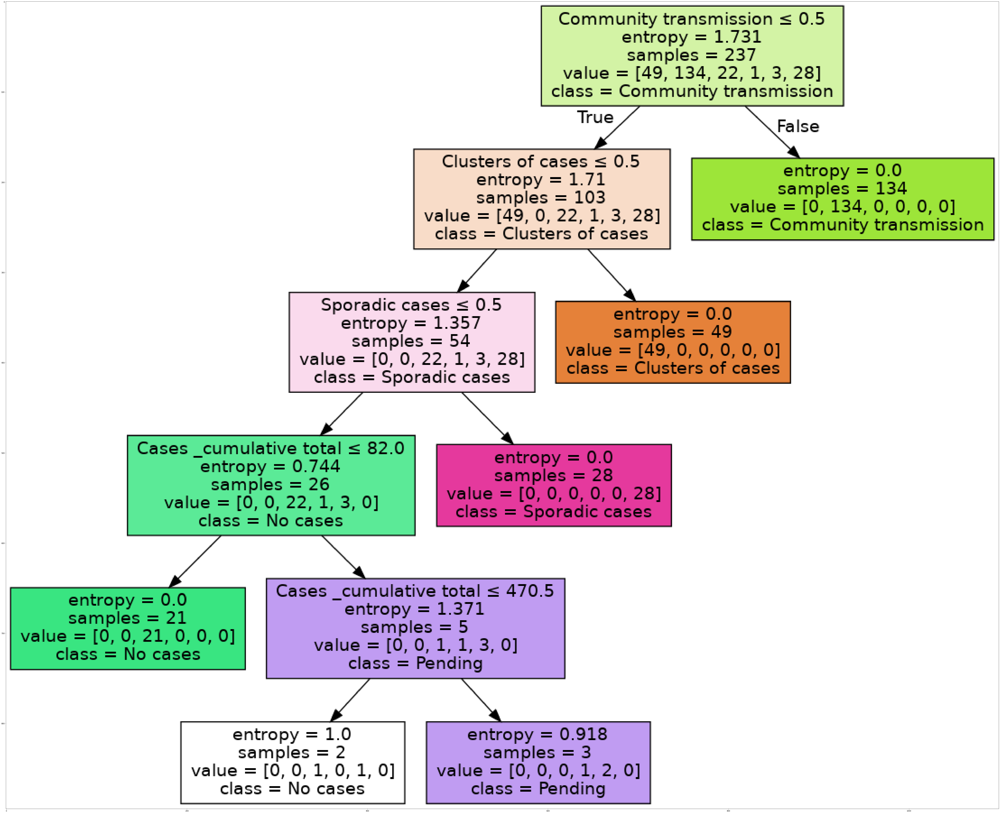

In [79]:
dot_data = StringIO()
filename = "TCtree.png"
featureNames = Feature.columns
targetNames = df['Transmission Classification'].tolist()
out=tree.export_graphviz(CovidTree,feature_names=featureNames, out_file=dot_data, class_names= np.unique(y), filled=True,  special_characters=True,rotate=False)  
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png(filename)
img = mpimg.imread(filename)
plt.figure(figsize=(100, 200))
plt.imshow(img,interpolation='nearest')

In [80]:
from sklearn.datasets import load_iris
from sklearn import tree
clf = tree.DecisionTreeClassifier()
iris = load_iris()
clf = clf.fit(iris.data, iris.target)
tree.export_graphviz(clf, out_file='tree.dot')

<h2> Evaluating the Accuracy of Decison Tree Alforithm</h2>

<b> 

Use Decision Tree object previously trained.
</b>

In [82]:
yhat_tree=CovidTree.predict(X_initial)
tree_jacc_test=metrics.jaccard_score(y, yhat_tree, average='micro')
tree_f1_test=metrics.f1_score(y, yhat_tree, average ='macro')
tree_cnf_matrix = confusion_matrix(y, yhat_tree)
print("Accuracy is ", tree_jacc_test, " F1 is" , tree_f1_test)
print(classification_report(y, yhat_tree))
tree_cnf_matrix

Accuracy is  0.9832635983263598  F1 is 0.774074074074074
                        precision    recall  f1-score   support

     Clusters of cases       1.00      1.00      1.00        49
Community transmission       1.00      1.00      1.00       134
              No cases       0.96      1.00      0.98        22
        Not applicable       0.00      0.00      0.00         1
               Pending       0.67      0.67      0.67         3
        Sporadic cases       1.00      1.00      1.00        28

              accuracy                           0.99       237
             macro avg       0.77      0.78      0.77       237
          weighted avg       0.99      0.99      0.99       237



/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


array([[ 49,   0,   0,   0,   0,   0],
       [  0, 134,   0,   0,   0,   0],
       [  0,   0,  22,   0,   0,   0],
       [  0,   0,   0,   0,   1,   0],
       [  0,   0,   1,   0,   2,   0],
       [  0,   0,   0,   0,   0,  28]])

In [83]:
df_report.loc['Decision Tree','Jaccard'] = tree_jacc_test
df_report.loc['Decision Tree','F1-score'] = tree_f1_test

<h2> Support Vector Machine</h2>

In [84]:
from sklearn import svm
TCSVM = svm.SVC(kernel='rbf')
TCSVM.fit(X, y)

SVC()

<h2> Calculate accuracy and F1 for Support Vector Machine</h2>

<b> Use SVM object previously trained.</b>

In [85]:
yhat_svm=TCSVM.predict(X)
svm_jacc_test=metrics.jaccard_score(y, yhat_svm, average ='macro')
svm_f1_test=metrics.f1_score(y, yhat_svm, average ='macro')
svm_cnf_matrix = confusion_matrix(y, yhat_svm)
print("Accuracy is ", svm_jacc_test, " F1 is" , svm_f1_test)
print(classification_report(y, yhat_svm))
svm_cnf_matrix

Accuracy is  0.6410256410256411  F1 is 0.6527777777777778
                        precision    recall  f1-score   support

     Clusters of cases       1.00      1.00      1.00        49
Community transmission       1.00      1.00      1.00       134
              No cases       0.85      1.00      0.92        22
        Not applicable       0.00      0.00      0.00         1
               Pending       0.00      0.00      0.00         3
        Sporadic cases       1.00      1.00      1.00        28

              accuracy                           0.98       237
             macro avg       0.64      0.67      0.65       237
          weighted avg       0.97      0.98      0.98       237



/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


array([[ 49,   0,   0,   0,   0,   0],
       [  0, 134,   0,   0,   0,   0],
       [  0,   0,  22,   0,   0,   0],
       [  0,   0,   1,   0,   0,   0],
       [  0,   0,   3,   0,   0,   0],
       [  0,   0,   0,   0,   0,  28]])

In [86]:
df_report.loc['SVM','Jaccard'] = svm_jacc_test
df_report.loc['SVM','F1-score'] = svm_f1_test

<h2> Logistic Regression</h2>

In [87]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
LR = LogisticRegression(C=1.0, solver='liblinear').fit(X,y)
LR

LogisticRegression(solver='liblinear')

In [88]:
yhat_LR = LR.predict(X)

<h2> Calculate accuracy, F1 and log_loss for Logistic Regression.</h2>

In [94]:
yhat_proba_LR = LR.predict_proba(X)
yhat_LR=LR.predict(X)
LR_jacc_test=metrics.jaccard_score(y, yhat_LR, average ='macro')
LR_f1_test=metrics.f1_score(y, yhat_LR, average ='macro')
LR_cnf_matrix = confusion_matrix(y, yhat_LR)
LR_log_loss=metrics.log_loss(y, yhat_proba_LR)
print("Accuracy is ", LR_jacc_test, " F1 is" , LR_f1_test, " log_loss is", LR_log_loss)
print(classification_report(y, yhat_LR))
LR_cnf_matrix

Accuracy is  0.6410256410256411  F1 is 0.6527777777777778  log_loss is 0.14610621326033857
                        precision    recall  f1-score   support

     Clusters of cases       1.00      1.00      1.00        49
Community transmission       1.00      1.00      1.00       134
              No cases       0.85      1.00      0.92        22
        Not applicable       0.00      0.00      0.00         1
               Pending       0.00      0.00      0.00         3
        Sporadic cases       1.00      1.00      1.00        28

              accuracy                           0.98       237
             macro avg       0.64      0.67      0.65       237
          weighted avg       0.97      0.98      0.98       237



/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


array([[ 49,   0,   0,   0,   0,   0],
       [  0, 134,   0,   0,   0,   0],
       [  0,   0,  22,   0,   0,   0],
       [  0,   0,   1,   0,   0,   0],
       [  0,   0,   3,   0,   0,   0],
       [  0,   0,   0,   0,   0,  28]])

In [95]:
df_report.loc['LogisticRegression','Jaccard'] = LR_jacc_test
df_report.loc['LogisticRegression','F1-score'] = LR_f1_test
df_report.loc['LogisticRegression','LogLoss'] = LR_log_loss

<h2> Report</h2>

In [96]:
df_report

,Jaccard,F1-score,LogLoss
KNN,0.935484,0.966667,NA
Decision Tree,0.983264,0.774074,NA
SVM,0.641026,0.652778,NA
LogisticRegression,0.641026,0.652778,0.146106


<h2> Classification with 80% Training dataset and 20% Test dataset</h2>



Now, it is your turn, use the training set to build an accurate model. Then use the test set to report the accuracy of the model. The following algorithms are to be used: • K Nearest Neighbor(KNN) • Decision Tree • Support Vector Machine • Logistic Regression


<h2> K Nearest Neighbor(KNN)</h2>

In [98]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=4)
print('Train set:', X_train.shape, y_train.shape)
print('Test set:', X_test.shape, y_test.shape)

Train set: (189, 5) (189,)
Test set: (48, 5) (48,)


Test set accuracy with k = 1 is 0.96
Test set accuracy with k = 2 is 0.96
Test set accuracy with k = 3 is 0.98
Test set accuracy with k = 4 is 0.98
Test set accuracy with k = 5 is 0.98
Test set accuracy with k = 6 is 0.98
Test set accuracy with k = 7 is 0.98
Test set accuracy with k = 8 is 0.98
Test set accuracy with k = 9 is 0.98
Test set accuracy with k = 10 is 0.98
Test set accuracy with k = 11 is 0.98
Test set accuracy with k = 12 is 0.98
Test set accuracy with k = 13 is 0.98
Test set accuracy with k = 14 is 0.98

Highest accuracy is achieved with k = 3


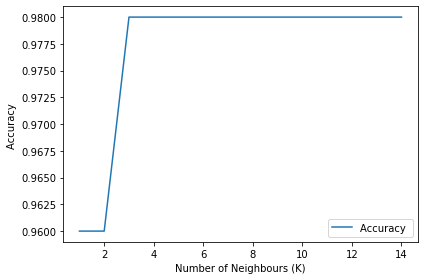

In [100]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
import seaborn as sns

ks = range(1,15)
accs = []
for k in ks:
    knn = KNeighborsClassifier(n_neighbors = k).fit(X_train, y_train)

    yhat = knn.predict(X_test)
    acc = round(metrics.accuracy_score(y_test, yhat),2)
    accs.append(acc)
    print("Test set accuracy with k =", k, "is", acc)
sns.lineplot(ks, accs)

bestk = ks[accs.index(max(accs))]
print("\nHighest accuracy is achieved with k =", bestk)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Neighbours (K)')
plt.tight_layout()
knn = KNeighborsClassifier(n_neighbors = bestk).fit(X_train, y_train)

<h2> Decision Tree</h2>

Test set accuracy with depth = 5 is 0.96
Test set accuracy with depth = 6 is 0.96
Test set accuracy with depth = 7 is 0.96
Test set accuracy with depth = 8 is 0.96
Test set accuracy with depth = 9 is 0.96
Test set accuracy with depth = 10 is 0.96
Test set accuracy with depth = 11 is 0.96
Test set accuracy with depth = 12 is 0.96
Test set accuracy with depth = 13 is 0.96
Test set accuracy with depth = 14 is 0.96
Test set accuracy with depth = 15 is 0.96

Highest accuracy is achieved with depth = 5


DecisionTreeClassifier(criterion='entropy', max_depth=5)

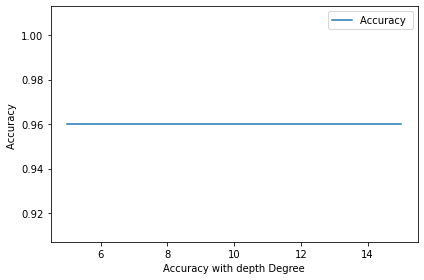

In [101]:
from sklearn.tree import DecisionTreeClassifier
ds = range(5,16)
accs = []
for d in ds:
    dtree = DecisionTreeClassifier(criterion="entropy", max_depth = d)
    dtree.fit(X_train, y_train)
    yhat = dtree.predict(X_test)
    acc = round(metrics.accuracy_score(y_test, yhat), 2)
    accs.append(acc)
    print("Test set accuracy with depth =", d, "is", acc)
sns.lineplot(ds, accs)

bestd = ds[accs.index(max(accs))]
print("\nHighest accuracy is achieved with depth =", bestd)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Accuracy with depth Degree')
plt.tight_layout()
dtree = DecisionTreeClassifier(criterion="entropy", max_depth = bestd)
dtree.fit(X_train, y_train)

<h2> Support Vector Machine</h2> 

Test set accuracy with degree = 1 is 0.98
Test set accuracy with degree = 2 is 0.98
Test set accuracy with degree = 3 is 0.9
Test set accuracy with degree = 4 is 0.9
Test set accuracy with degree = 5 is 0.9
Test set accuracy with degree = 6 is 0.9
Test set accuracy with degree = 7 is 0.9
Test set accuracy with degree = 8 is 0.9
Test set accuracy with degree = 9 is 0.9
Test set accuracy with degree = 10 is 0.9
Test set accuracy with degree = 11 is 0.9
Test set accuracy with degree = 12 is 0.9
Test set accuracy with degree = 13 is 0.9
Test set accuracy with degree = 14 is 0.9
Test set accuracy with degree = 15 is 0.9

Highest accuracy is achieved with degree = 1


SVC(degree=1, kernel='poly')

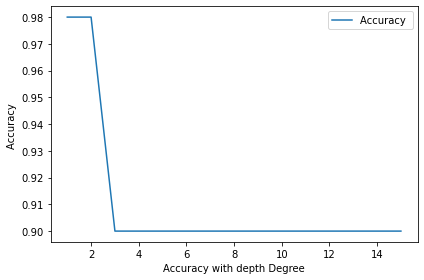

In [102]:
from sklearn import svm
degs = range(1,16)
accs = []
for deg in degs:
    svm_clf = svm.SVC(kernel='poly', degree=deg)
    svm_clf.fit(X_train, y_train)
    yhat = svm_clf.predict(X_test)
    acc = round(metrics.accuracy_score(y_test, yhat), 2)
    accs.append(acc)
    print("Test set accuracy with degree =", deg, "is", acc)
sns.lineplot(degs, accs)

bestdeg = degs[accs.index(max(accs))]
print("\nHighest accuracy is achieved with degree =", bestdeg)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Accuracy with depth Degree')
plt.tight_layout()
svm_clf = svm.SVC(kernel='poly', degree=bestdeg)
svm_clf.fit(X_train, y_train)

<h2> Logistic Regression</h2>

Test set accuracy with c = 0.01 is 0.98
Test set accuracy with c = 0.02 is 0.98
Test set accuracy with c = 0.05 is 0.98
Test set accuracy with c = 0.75 is 0.98
Test set accuracy with c = 0.1 is 0.98
Test set accuracy with c = 0.5 is 0.98
Test set accuracy with c = 0.75 is 0.98
Test set accuracy with c = 1 is 0.98

Highest accuracy is achieved with c = 0.01


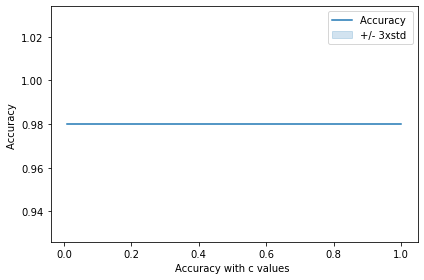

In [103]:
from sklearn.linear_model import LogisticRegression
cs = [0.01, 0.02, 0.05, 0.75, 0.1, 0.5, 0.75, 1]
accs = []
for c in cs:
    lr = LogisticRegression(C=c, solver='liblinear').fit(X_train, y_train)
    yhat = lr.predict(X_test)
    acc = round(metrics.accuracy_score(y_test, yhat), 2)
    accs.append(acc)
    print("Test set accuracy with c =", c, "is", acc)
sns.lineplot(cs, accs)

bestc = cs[accs.index(max(accs))]
print("\nHighest accuracy is achieved with c =", bestc)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Accuracy with c values ')
plt.tight_layout()
lr = LogisticRegression(C=bestc, solver='liblinear').fit(X_train, y_train)

<h2> END</h2>